Here is the Link 👉 [Google-Colab](https://colab.research.google.com/drive/1YtSNGtknLT6cHc43dIKRc488UveFO5y3#scrollTo=INzQeAL-T0bd)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt


In [ ]:
# Download the Data through Kaggle API
from google.colab import files

In [ ]:
# Using Kaggle API to Download the Dataset

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 63 bytes


In [ ]:
# Download the Dataset
!kaggle datasets download -d csafrit2/plant-leaves-for-image-classification

plant-leaves-for-image-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
from zipfile import ZipFile
file_name = "/content/plant-leaves-for-image-classification.zip"
with ZipFile(file_name,'r') as zip:
  zip.extractall()
  print('Done')
  zip.extractall(path="/content")

Done


In [ ]:
# We send some random train images from each and every classes to test folder with respective of classes
# It will help us to dataset imbalance to preventing from overfitting

import os
import shutil
import random

train_path = "/content/Plants_2/train/"  
test_path = "/content/Plants_2/test/"  
test_size = 0.2 # fraction of images to move to test folder

for folder_name in os.listdir(train_path):
    folder_path = os.path.join(train_path, folder_name)
    if os.path.isdir(folder_path):
        test_folder_path = os.path.join(test_path, folder_name)
        if not os.path.exists(test_folder_path):
            os.makedirs(test_folder_path)
        filenames = os.listdir(folder_path)
        random.shuffle(filenames)
        test_count = int(len(filenames) * test_size)
        test_files = filenames[:test_count]
        for file_name in test_files:
            file_path = os.path.join(folder_path, file_name)
            shutil.move(file_path, os.path.join(test_folder_path, file_name))


In [ ]:
train_path = "/content/Plants_2/train/"  
test_path = "/content/Plants_2/test/" 

In [ ]:
for folder_path in [train_path, test_path]:
    print('Folder:', folder_path)
    # Iterate through each subfolder
    for subfolder_name in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder_name)
        # Count the number of images in the subfolder
        num_images = len(os.listdir(subfolder_path))
        print('    Subfolder:', subfolder_name, '- Num images:', num_images)


Folder: /content/Plants_2/train/
    Subfolder: Bael diseased (P4b) - Num images: 86
    Subfolder: Pomegranate healthy (P9a) - Num images: 222
    Subfolder: Mango diseased (P0b) - Num images: 204
    Subfolder: Alstonia Scholaris healthy (P2b) - Num images: 135
    Subfolder: Gauva healthy (P3a) - Num images: 214
    Subfolder: Mango healthy (P0a) - Num images: 128
    Subfolder: Pongamia Pinnata healthy (P7a) - Num images: 250
    Subfolder: Jamun diseased (P5b) - Num images: 268
    Subfolder: Alstonia Scholaris diseased (P2a) - Num images: 196
    Subfolder: Basil healthy (P8) - Num images: 110
    Subfolder: Lemon healthy (P10a) - Num images: 120
    Subfolder: Arjun healthy (P1b) - Num images: 168
    Subfolder: Pongamia Pinnata diseased (P7b) - Num images: 212
    Subfolder: Jatropha diseased (P6b) - Num images: 92
    Subfolder: Lemon diseased (P10b) - Num images: 54
    Subfolder: Jatropha healthy (P6a) - Num images: 99
    Subfolder: Arjun diseased (P1a) - Num images: 178
  

Folder: /content/Plants_2/train/


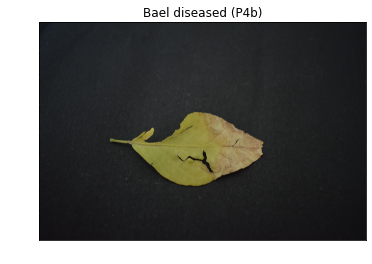

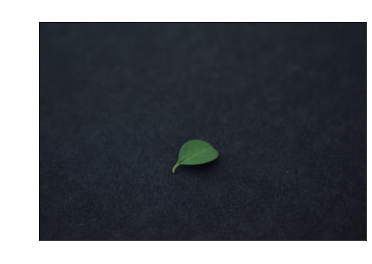

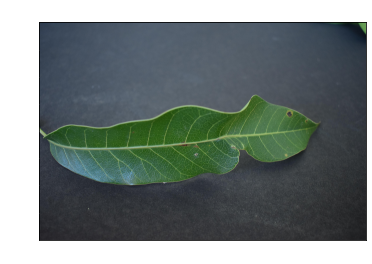

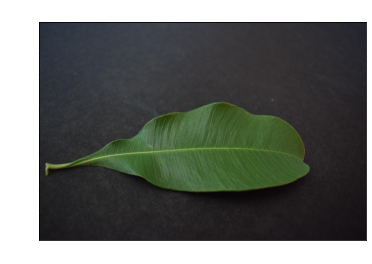

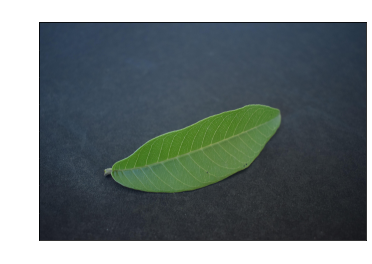

...

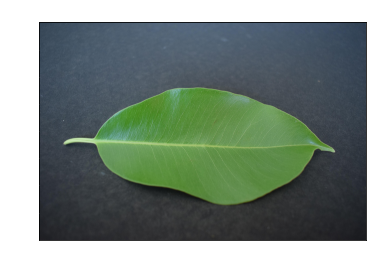

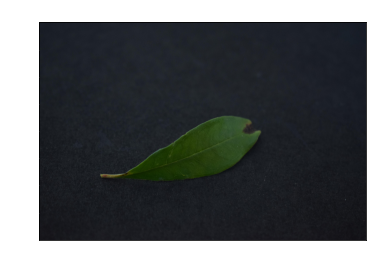

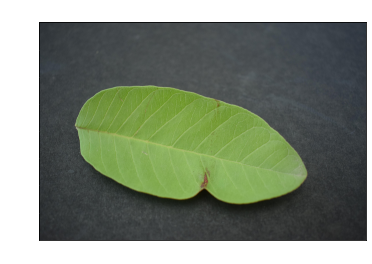

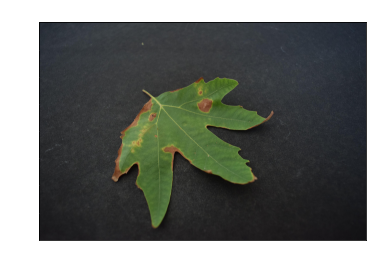

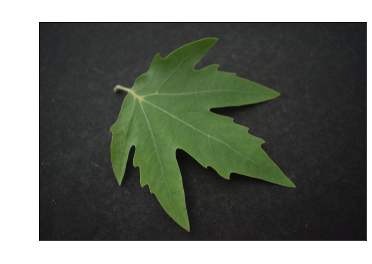

Folder: /content/Plants_2/test/


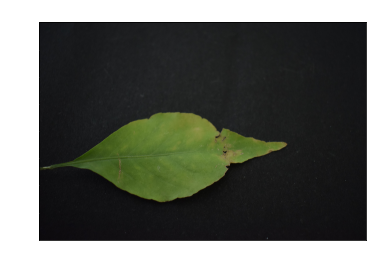

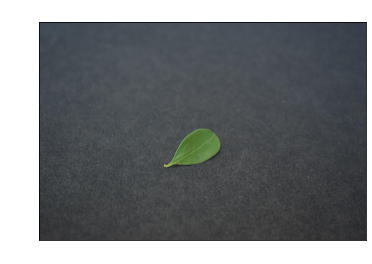

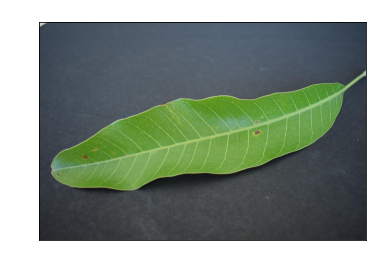

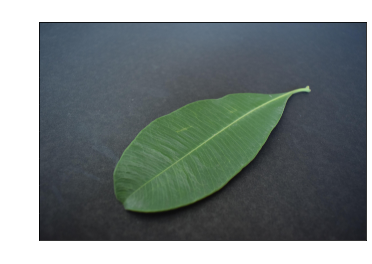

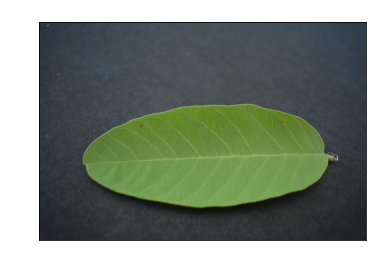

...

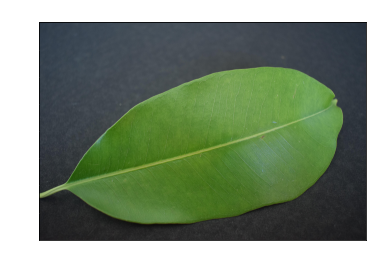

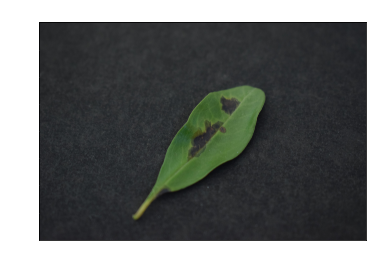

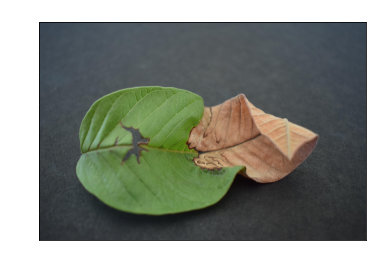

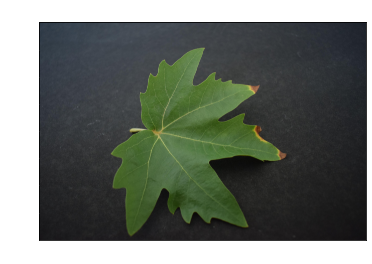

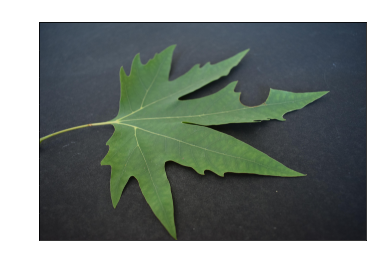

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define the number of random images to display from each subfolder
num_images_to_display = 1

# Iterate through the train and test folders
for folder_path in [train_path, test_path]:
    print('Folder:', folder_path)
    # Iterate through each subfolder
    for subfolder_name in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder_name)
        # Count the number of images in the subfolder
        num_images = len(os.listdir(subfolder_path))
        # Select some random images to display
        image_names = random.sample(os.listdir(subfolder_path), num_images_to_display)
        # Display the images
        for image_name in image_names:
            image_path = os.path.join(subfolder_path, image_name)
            image = mpimg.imread(image_path)
            plt.imshow(image)
            plt.rcParams['text.color'] = 'white'
            plt.tick_params(axis='x', colors='white')
            plt.tick_params(axis='y', colors='white')
            plt.title(subfolder_name)
            plt.show()


In [ ]:
batch_size = 64
img_height = 224
img_width = 224

In [ ]:
diseases = os.listdir(train_path)
print(diseases)

['Bael diseased (P4b)', 'Pomegranate healthy (P9a)', 'Mango diseased (P0b)', 'Alstonia Scholaris healthy (P2b)', 'Gauva healthy (P3a)', 'Mango healthy (P0a)', 'Pongamia Pinnata healthy (P7a)', 'Jamun diseased (P5b)', 'Alstonia Scholaris diseased (P2a)', 'Basil healthy (P8)', 'Lemon healthy (P10a)', 'Arjun healthy (P1b)', 'Pongamia Pinnata diseased (P7b)', 'Jatropha diseased (P6b)', 'Lemon diseased (P10b)', 'Jatropha healthy (P6a)', 'Arjun diseased (P1a)', 'Jamun healthy (P5a)', 'Pomegranate diseased (P9b)', 'Gauva diseased (P3b)', 'Chinar diseased (P11b)', 'Chinar healthy (P11a)']


In [ ]:
print("Total disease classes are: {}".format(len(diseases)))

Total disease classes are: 22


In [ ]:
plants = []
NumberOfDiseases = 0
for plant in diseases:
    if plant.split(' ')[0] not in plants:
        plants.append(plant.split(' ')[0])
    if plant.split(' ')[1] != 'healthy':
        NumberOfDiseases += 1

In [ ]:
print(f"Unique Plants are: \n{plants}")

Unique Plants are: 
['Bael', 'Pomegranate', 'Mango', 'Alstonia', 'Gauva', 'Pongamia', 'Jamun', 'Basil', 'Lemon', 'Arjun', 'Jatropha', 'Chinar']


In [ ]:
print("Number of plants: {}".format(len(plants)))

Number of plants: 12


In [ ]:
# Number of images for each disease
import pandas as pd
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(train_path + '/' + disease))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Bael diseased (P4b),86
Pomegranate healthy (P9a),222
Mango diseased (P0b),204
Alstonia Scholaris healthy (P2b),135
Gauva healthy (P3a),214
Mango healthy (P0a),128
Pongamia Pinnata healthy (P7a),250
Jamun diseased (P5b),268
Alstonia Scholaris diseased (P2a),196
Basil healthy (P8),110


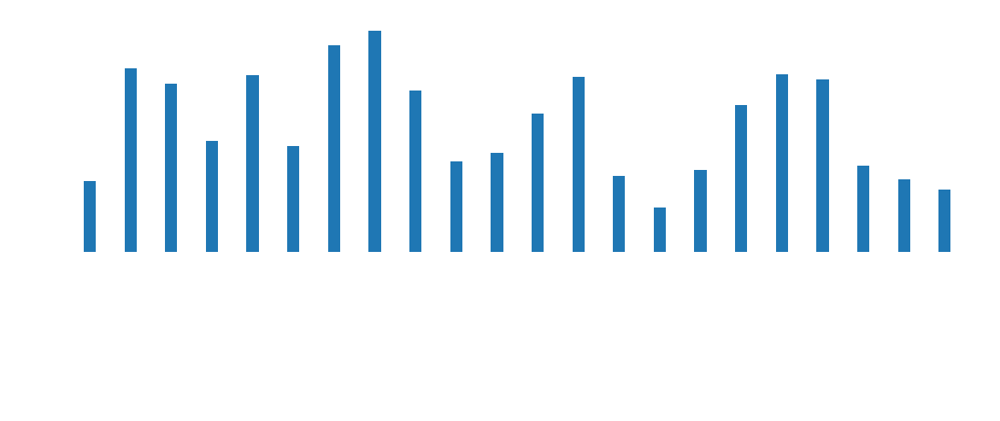

In [ ]:
# plotting number of images available for each disease
index = [n for n in range(22)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=13, color='white')
plt.ylabel('No of images available', fontsize=10, color='white')
plt.xticks(index, diseases, fontsize=10, rotation=90, color='white')
plt.title('Images per each class of plant disease', color='white')
plt.gca().spines['bottom'].set_color('white')
plt.gca().spines['top'].set_color('white')
plt.gca().spines['right'].set_color('white')
plt.gca().spines['left'].set_color('white')
plt.tick_params(axis='x', colors='white')
plt.tick_params(axis='y', colors='white')
plt.show()

In [ ]:
import glob
def get_files(directory):
  if not os.path.exists(directory):
    return 0
  count=0
  # crawls inside folders
  for current_path,dirs,files in os.walk(directory):
    for dr in dirs:
      count+= len(glob.glob(os.path.join(current_path,dr+"/*")))
  return count
train_path ="/content/Plants_2/train"
test_path="/content/Plants_2/test"

#train file image count
train_samples =get_files(train_path)
#to get tags
num_classes=len(glob.glob(train_path+"/*")) 
#test file image count
test_samples=get_files(test_path)
print(num_classes,"Classes")
print(train_samples,"Train images")
print(test_samples,"Test images")

22 Classes
3428 Train images
1631 Test images


In [ ]:
import pathlib
train_dir = "/content/Plants_2/train/"
data_dir = pathlib.Path(train_dir)

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3428 files belonging to 22 classes.
Using 2743 files for training.


In [ ]:
test_dir = "/content/Plants_2/test"
data_dir = pathlib.Path(test_dir)

In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1631 files belonging to 22 classes.
Using 326 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['Alstonia Scholaris diseased (P2a)', 'Alstonia Scholaris healthy (P2b)', 'Arjun diseased (P1a)', 'Arjun healthy (P1b)', 'Bael diseased (P4b)', 'Basil healthy (P8)', 'Chinar diseased (P11b)', 'Chinar healthy (P11a)', 'Gauva diseased (P3b)', 'Gauva healthy (P3a)', 'Jamun diseased (P5b)', 'Jamun healthy (P5a)', 'Jatropha diseased (P6b)', 'Jatropha healthy (P6a)', 'Lemon diseased (P10b)', 'Lemon healthy (P10a)', 'Mango diseased (P0b)', 'Mango healthy (P0a)', 'Pomegranate diseased (P9b)', 'Pomegranate healthy (P9a)', 'Pongamia Pinnata diseased (P7b)', 'Pongamia Pinnata healthy (P7a)']


In [ ]:
n_train = 0
for value in nums.values():
    n_train += value
print(f"There are {n_train} images for training")

There are 3428 images for training


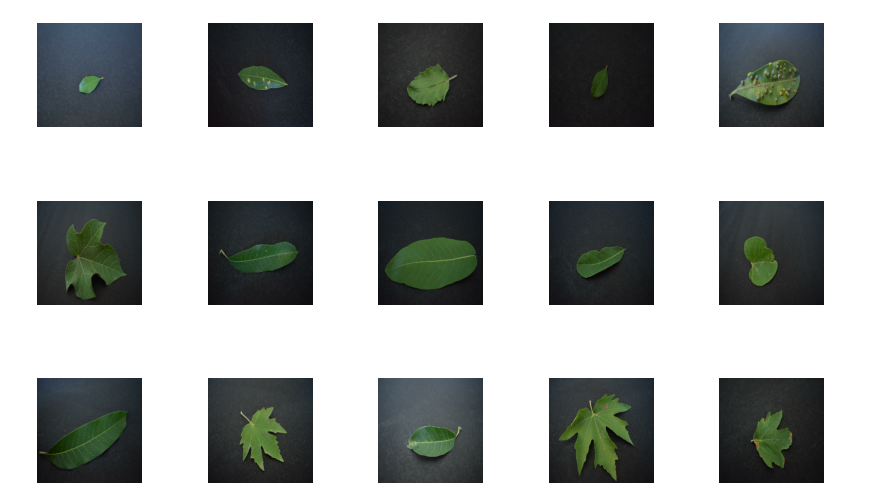

In [ ]:
# Visualize the data
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
for images, labels in train_ds.take(1):
  for i in range(15):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")
    plt.rcParams['text.color'] = 'white'
    plt.tick_params(axis='x', colors='white')
    plt.tick_params(axis='y', colors='white')


plt.subplots_adjust(wspace=0.1, hspace=0.7)
plt.show()


In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(64, 224, 224, 3)
(64,)


In [ ]:
# Configure the dataset for performance
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
normalization_layer = layers.Rescaling(1./255)

In [ ]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


0.021188628 0.7176471


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from keras import regularizers

# Set the regularization strength
l2 = 0.001

# Create the model with L2 regularization
model = keras.Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    
    layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),

    layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.4),

    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 224, 224, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0

In [ ]:
from tensorflow.keras import optimizers

model.compile(optimizer=optimizers.Adam(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
num_epochs = 40
# Train the model
history = model.fit(train_ds, 
                    validation_data=val_ds, 
                    epochs=num_epochs)


Epoch 1/40
43/43 [==============================] - 83s 2s/step - loss: 2.8851 - accuracy: 0.5968 - val_loss: 7.2511 - val_accuracy: 0.0521
Epoch 2/40
43/43 [==============================] - 21s 478ms/step - loss: 2.3469 - accuracy: 0.7991 - val_loss: 11.1311 - val_accuracy: 0.0644
Epoch 3/40
43/43 [==============================] - 21s 478ms/step - loss: 2.1274 - accuracy: 0.8505 - val_loss: 14.9069 - val_accuracy: 0.0798
Epoch 4/40
43/43 [==============================] - 21s 481ms/step - loss: 1.9421 - accuracy: 0.8997 - val_loss: 11.7142 - val_accuracy: 0.0583
Epoch 5/40
43/43 [==============================] - 21s 481ms/step - loss: 1.6862 - accuracy: 0.9347 - val_loss: 17.7499 - val_accuracy: 0.0798
Epoch 6/40
43/43 [==============================] - 21s 490ms/step - loss: 1.5062 - accuracy: 0.9395 - val_loss: 14.4660 - val_accuracy: 0.0798
Epoch 7/40
43/43 [==============================] - 21s 482ms/step - loss: 1.3699 - accuracy: 0.9548 - val_loss: 24.6897 - val_accuracy: 0.0

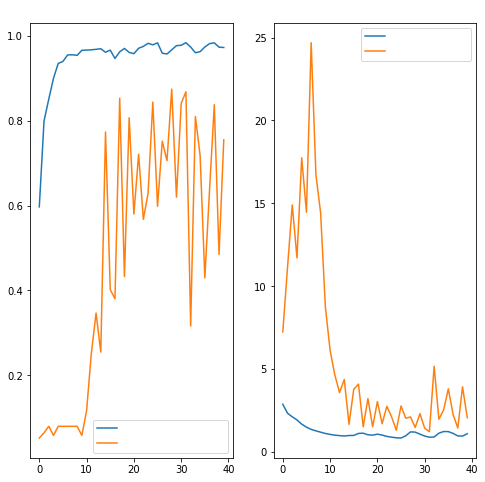

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(num_epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.rcParams['text.color'] = 'black'
plt.tick_params(axis='x', colors='black')
plt.tick_params(axis='y', colors='black')
plt.show()

In [ ]:
# set parameter values for increase accuracy and decrease loss value

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal",
                           input_shape=(img_height, img_width, 3)),
        layers.RandomRotation(0.3),  # increased rotation angle
        layers.RandomZoom(0.3),  # increased zoom range
        layers.RandomContrast(0.3),  # added contrast adjustment
        layers.RandomBrightness(0.3),  # added brightness adjustment
    ]
)


In [ ]:
from tensorflow.keras import layers

model = Sequential([
    data_augmentation,
    layers.Rescaling(1./255),
    
    layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),

    layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.4),

    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(l2)),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])    

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 224, 224, 32)      896       
                                                                 
 batch_normalization_7 (Batc  (None, 224, 224, 32)     128       
 hNormalization)                                                 
                                                                 
 conv2d_7 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_8 (Batc  (None, 224, 224, 32)     128       
 hNormalization)                                      

In [ ]:
from tensorflow.keras import optimizers

model.compile(optimizer=optimizers.Adam(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
epochs = 30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/30


43/43 [==============================] - 63s 1s/step - loss: 4.7121 - accuracy: 0.1615 - val_loss: 5.9900 - val_accuracy: 0.0798
Epoch 2/30
43/43 [==============================] - 54s 1s/step - loss: 4.7758 - accuracy: 0.2107 - val_loss: 7.4133 - val_accuracy: 0.0521
Epoch 3/30
43/43 [==============================] - 53s 1s/step - loss: 4.2735 - accuracy: 0.3051 - val_loss: 9.4369 - val_accuracy: 0.0521
Epoch 4/30
43/43 [==============================] - 53s 1s/step - loss: 4.1111 - accuracy: 0.3179 - val_loss: 7.4750 - val_accuracy: 0.0521
Epoch 5/30
43/43 [==============================] - 53s 1s/step - loss: 3.9074 - accuracy: 0.3423 - val_loss: 8.4492 - val_accuracy: 0.0521
Epoch 6/30
43/43 [==============================] - 53s 1s/step - loss: 3.5743 - accuracy: 0.4003 - val_loss: 6.2773 - val_accuracy: 0.0552
Epoch 7/30
43/43 [==============================] - 52s 1s/step - loss: 3.4239 - accuracy: 0.4131 - val_loss: 5.3094 - val_accuracy: 0.0798
Epoch 8/30
43/43 [=============

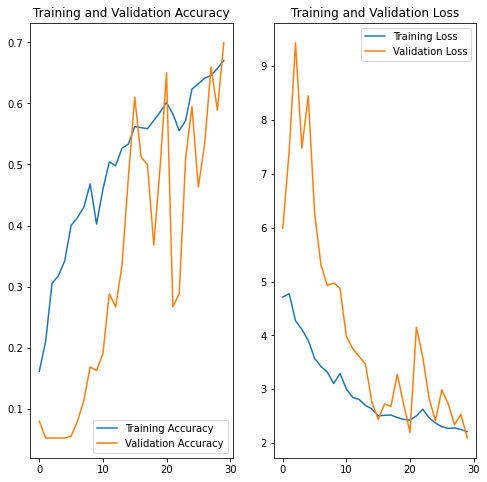

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.rcParams['text.color'] = 'black'
plt.tick_params(axis='x', colors='black')
plt.tick_params(axis='y', colors='black')

plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.show()

1/1 [==============================] - 0s 68ms/step


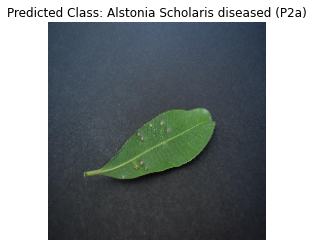

1/1 [==============================] - 0s 20ms/step


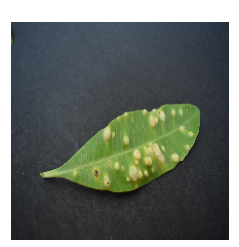

1/1 [==============================] - 0s 20ms/step


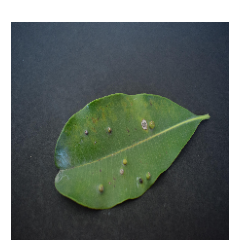

1/1 [==============================] - 0s 22ms/step


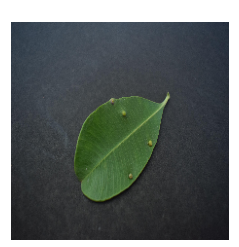

1/1 [==============================] - 0s 23ms/step


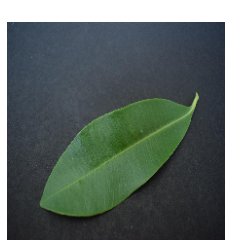

1/1 [==============================] - 0s 26ms/step


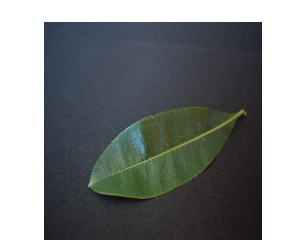

1/1 [==============================] - 0s 32ms/step


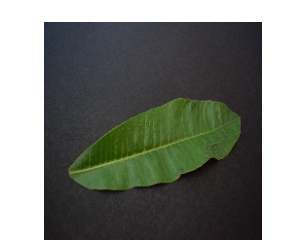

1/1 [==============================] - 0s 36ms/step


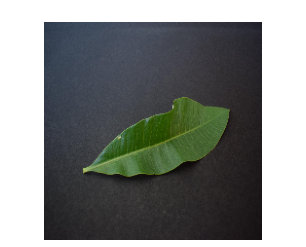

1/1 [==============================] - 0s 39ms/step


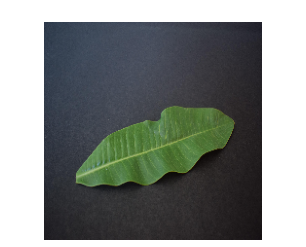

1/1 [==============================] - 0s 24ms/step


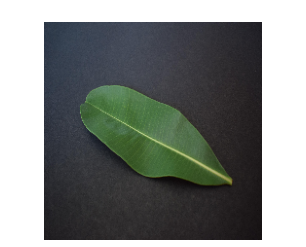

1/1 [==============================] - 0s 27ms/step


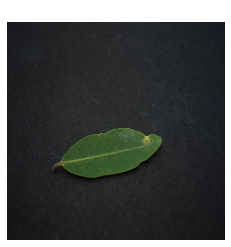

1/1 [==============================] - 0s 24ms/step


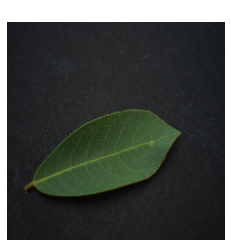

1/1 [==============================] - 0s 23ms/step


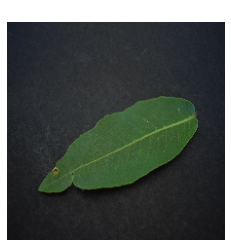

1/1 [==============================] - 0s 25ms/step


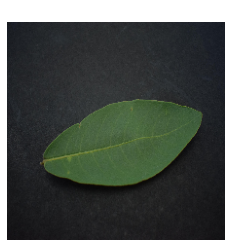

1/1 [==============================] - 0s 24ms/step


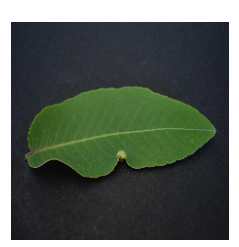

1/1 [==============================] - 0s 28ms/step


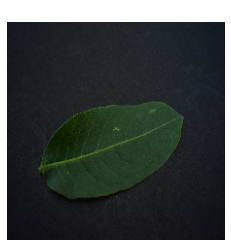

1/1 [==============================] - 0s 29ms/step


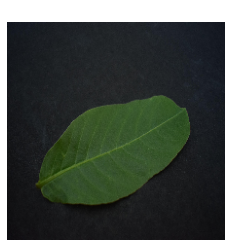

1/1 [==============================] - 0s 22ms/step


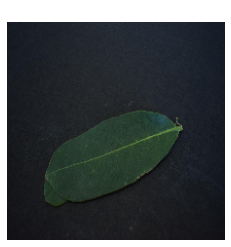

1/1 [==============================] - 0s 23ms/step


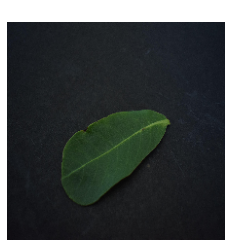

1/1 [==============================] - 0s 22ms/step


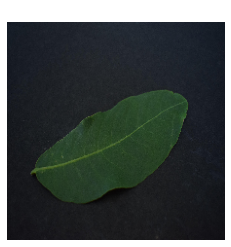

1/1 [==============================] - 0s 24ms/step


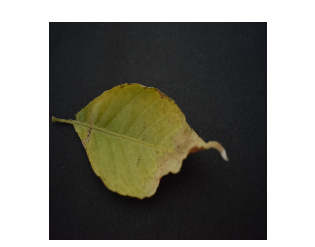

1/1 [==============================] - 0s 24ms/step


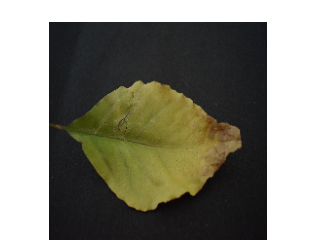

1/1 [==============================] - 0s 25ms/step


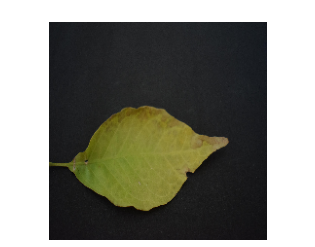

1/1 [==============================] - 0s 24ms/step


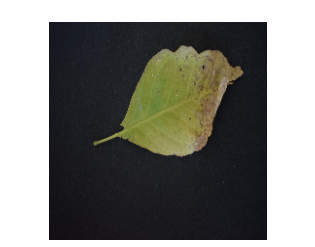

1/1 [==============================] - 0s 21ms/step


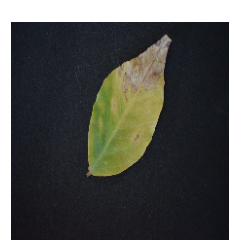

1/1 [==============================] - 0s 29ms/step


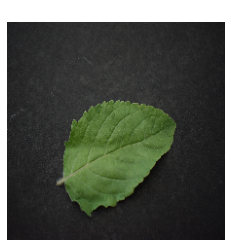

1/1 [==============================] - 0s 22ms/step


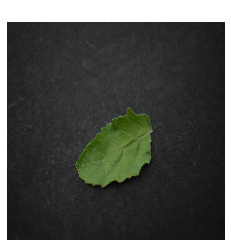

1/1 [==============================] - 0s 44ms/step


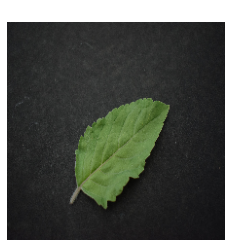

1/1 [==============================] - 0s 29ms/step


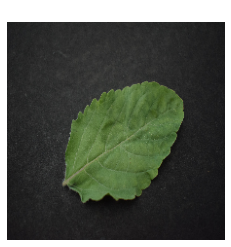

1/1 [==============================] - 0s 28ms/step


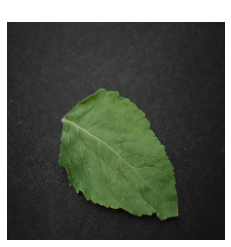

1/1 [==============================] - 0s 20ms/step


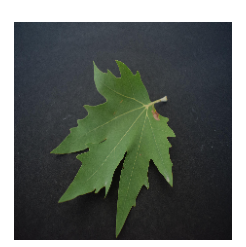

1/1 [==============================] - 0s 20ms/step


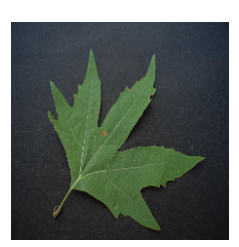

1/1 [==============================] - 0s 20ms/step


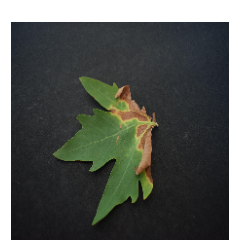

1/1 [==============================] - 0s 30ms/step


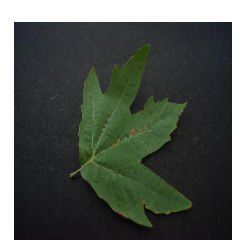

1/1 [==============================] - 0s 25ms/step


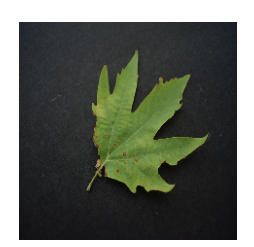

1/1 [==============================] - 0s 21ms/step


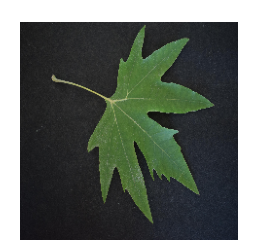

1/1 [==============================] - 0s 20ms/step


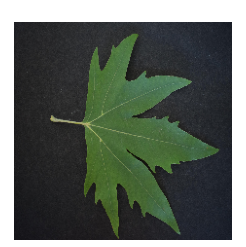

1/1 [==============================] - 0s 20ms/step


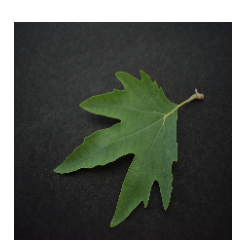

1/1 [==============================] - 0s 22ms/step


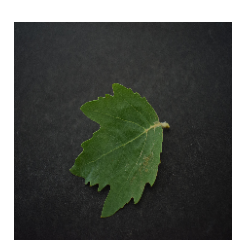

1/1 [==============================] - 0s 20ms/step


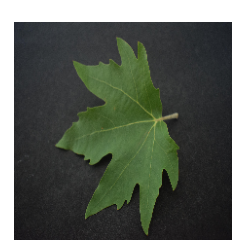

1/1 [==============================] - 0s 21ms/step


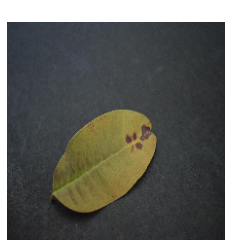

1/1 [==============================] - 0s 21ms/step


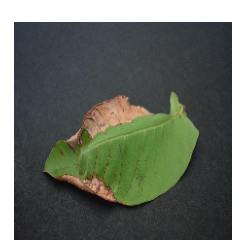

1/1 [==============================] - 0s 24ms/step


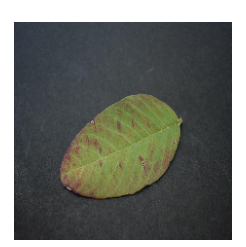

1/1 [==============================] - 0s 23ms/step


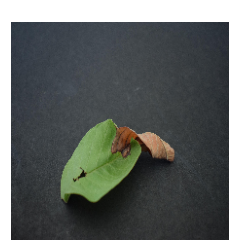

1/1 [==============================] - 0s 21ms/step


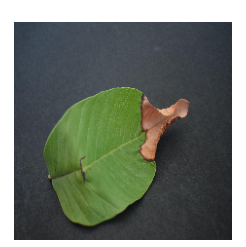

1/1 [==============================] - 0s 22ms/step


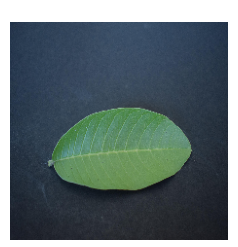

1/1 [==============================] - 0s 20ms/step


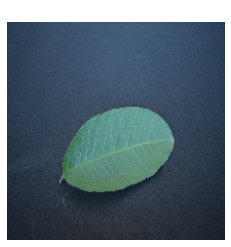

1/1 [==============================] - 0s 42ms/step


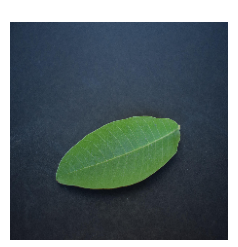

1/1 [==============================] - 0s 32ms/step


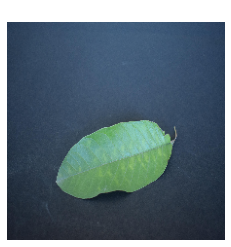

1/1 [==============================] - 0s 31ms/step


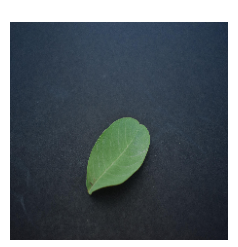

1/1 [==============================] - 0s 27ms/step


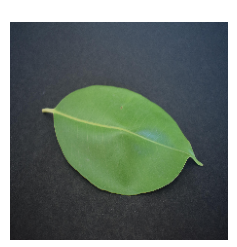

1/1 [==============================] - 0s 22ms/step


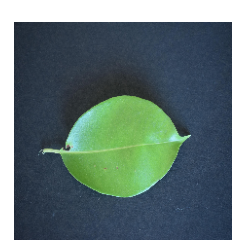

1/1 [==============================] - 0s 23ms/step


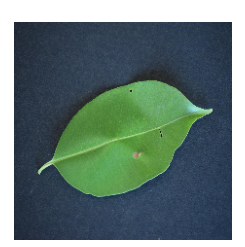

1/1 [==============================] - 0s 21ms/step


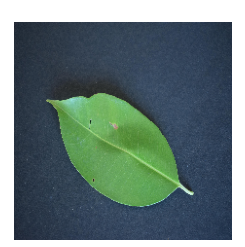

1/1 [==============================] - 0s 20ms/step


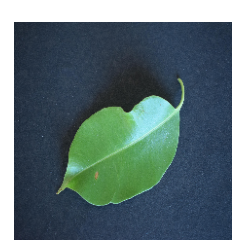

1/1 [==============================] - 0s 22ms/step


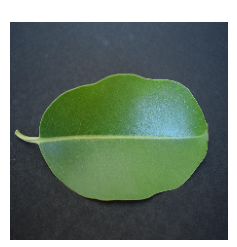

1/1 [==============================] - 0s 22ms/step


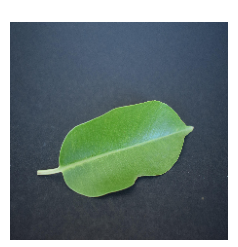

1/1 [==============================] - 0s 20ms/step


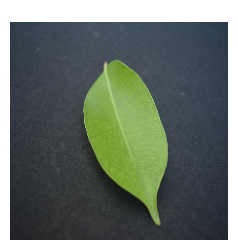

1/1 [==============================] - 0s 21ms/step


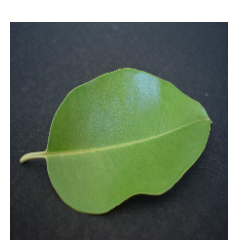

1/1 [==============================] - 0s 25ms/step


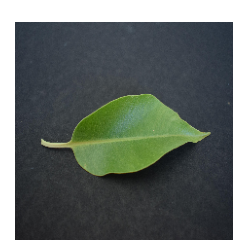

1/1 [==============================] - 0s 24ms/step


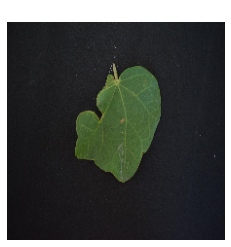

1/1 [==============================] - 0s 24ms/step


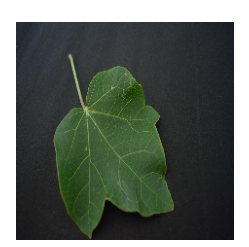

1/1 [==============================] - 0s 26ms/step


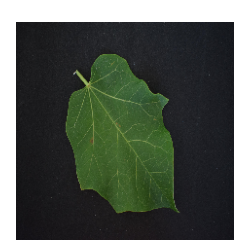

1/1 [==============================] - 0s 20ms/step


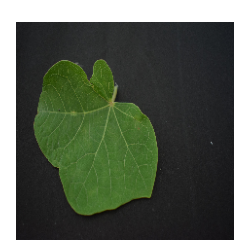

1/1 [==============================] - 0s 20ms/step


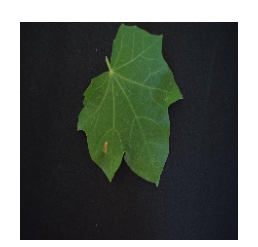

1/1 [==============================] - 0s 21ms/step


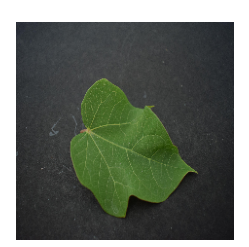

1/1 [==============================] - 0s 22ms/step


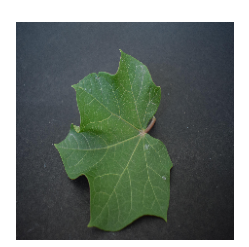

1/1 [==============================] - 0s 29ms/step


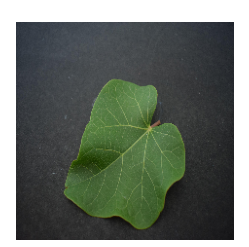

1/1 [==============================] - 0s 29ms/step


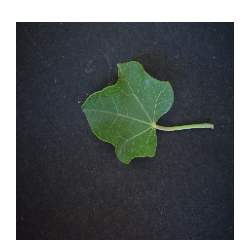

1/1 [==============================] - 0s 29ms/step


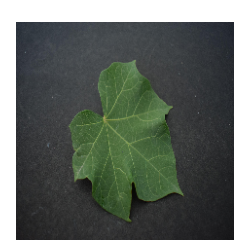

1/1 [==============================] - 0s 34ms/step


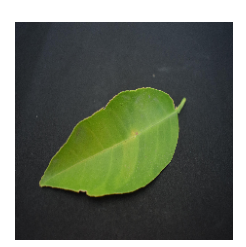

1/1 [==============================] - 0s 21ms/step


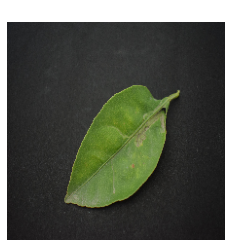

1/1 [==============================] - 0s 20ms/step


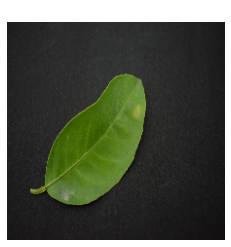

1/1 [==============================] - 0s 22ms/step


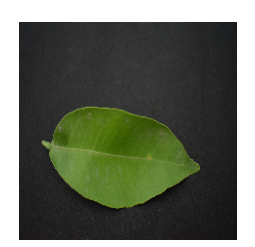

1/1 [==============================] - 0s 20ms/step


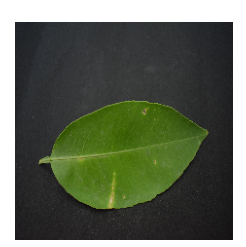

1/1 [==============================] - 0s 23ms/step


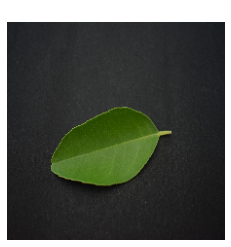

1/1 [==============================] - 0s 23ms/step


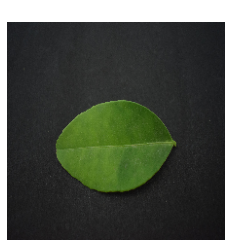

1/1 [==============================] - 0s 23ms/step


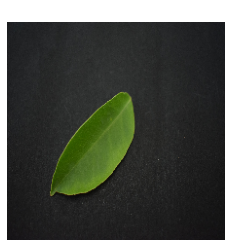

1/1 [==============================] - 0s 21ms/step


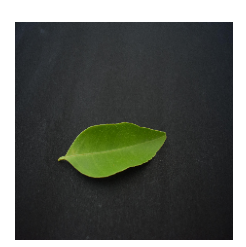

1/1 [==============================] - 0s 31ms/step


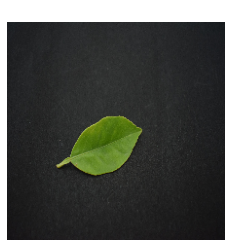

1/1 [==============================] - 0s 36ms/step


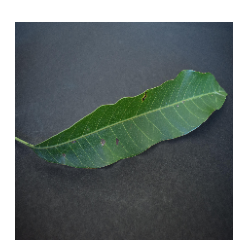

1/1 [==============================] - 0s 27ms/step


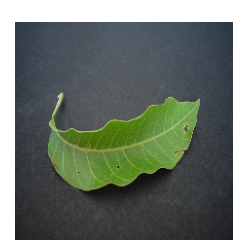

1/1 [==============================] - 0s 30ms/step


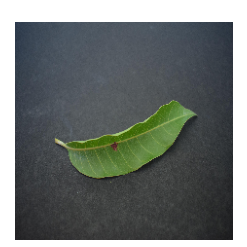

1/1 [==============================] - 0s 28ms/step


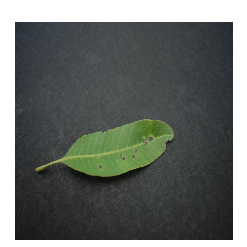

1/1 [==============================] - 0s 25ms/step


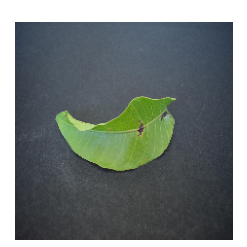

1/1 [==============================] - 0s 25ms/step


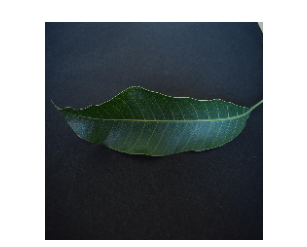

1/1 [==============================] - 0s 32ms/step


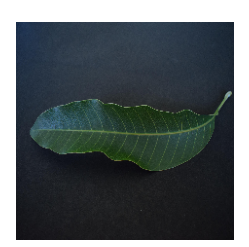

1/1 [==============================] - 0s 34ms/step


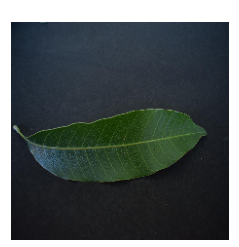

1/1 [==============================] - 0s 48ms/step


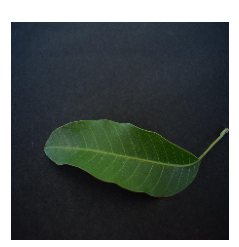

1/1 [==============================] - 0s 35ms/step


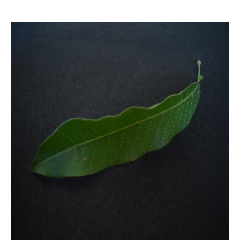

1/1 [==============================] - 0s 26ms/step


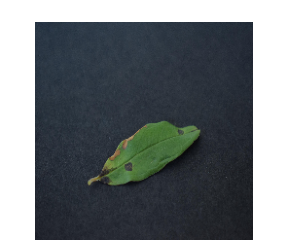

1/1 [==============================] - 0s 22ms/step


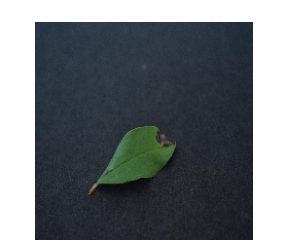

1/1 [==============================] - 0s 24ms/step


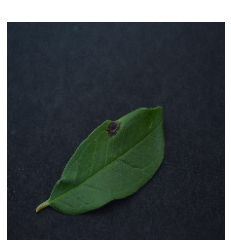

1/1 [==============================] - 0s 25ms/step


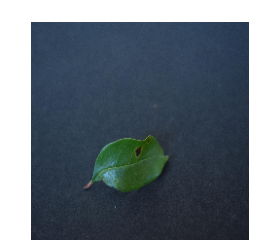

1/1 [==============================] - 0s 23ms/step


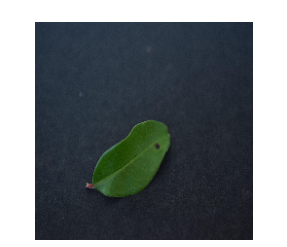

1/1 [==============================] - 0s 22ms/step


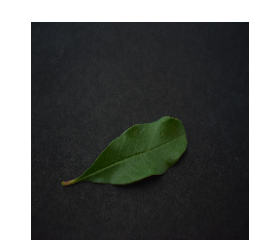

1/1 [==============================] - 0s 92ms/step


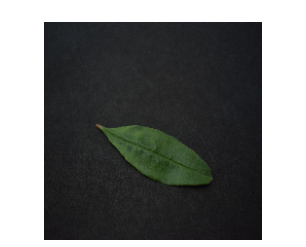

1/1 [==============================] - 0s 22ms/step


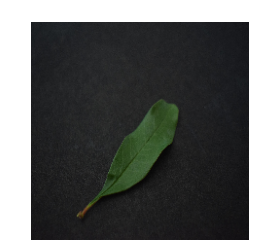

1/1 [==============================] - 0s 21ms/step


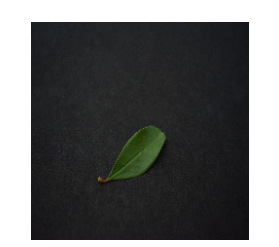

1/1 [==============================] - 0s 26ms/step


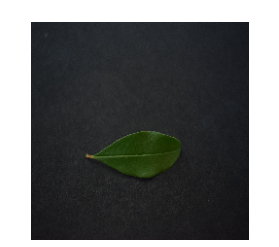

1/1 [==============================] - 0s 24ms/step


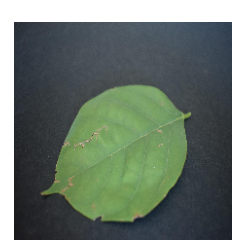

1/1 [==============================] - 0s 23ms/step


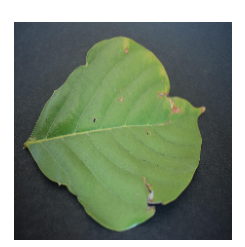

1/1 [==============================] - 0s 21ms/step


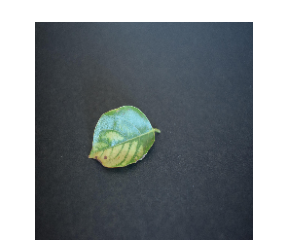

1/1 [==============================] - 0s 29ms/step


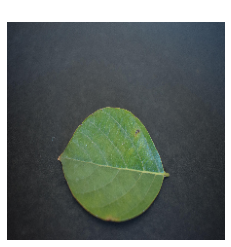

1/1 [==============================] - 0s 32ms/step


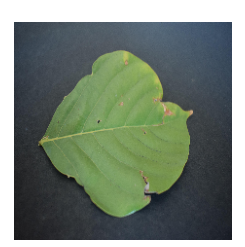

1/1 [==============================] - 0s 30ms/step


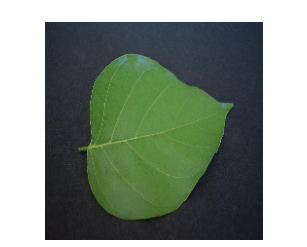

1/1 [==============================] - 0s 34ms/step


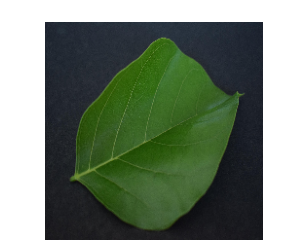

1/1 [==============================] - 0s 32ms/step


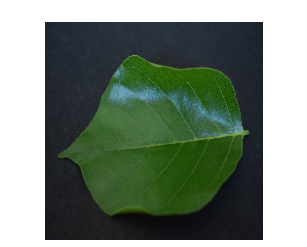

1/1 [==============================] - 0s 23ms/step


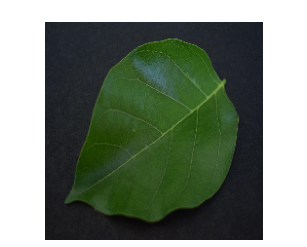

1/1 [==============================] - 0s 41ms/step


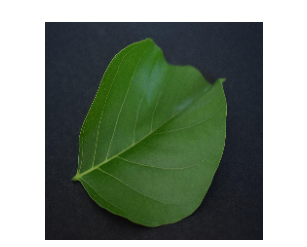

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

validation_dir = "/content/Plants_2/valid/"
img_height = 224
img_width = 224

# Get list of class names based on subdirectories
class_names = sorted(os.listdir(validation_dir))

# Load image using keras.preprocessing and predict with the model
for class_name in class_names:
    class_dir = os.path.join(validation_dir, class_name)
    for img_name in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_name)
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(img_height, img_width))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0) # Create a batch
        predictions = model.predict(img_array)
        score = tf.nn.softmax(predictions[0])
        pred_class = class_names[np.argmax(score)]
        
        # Show image and predicted label
        plt.imshow(img)
        plt.title("Predicted Class: {}".format(pred_class))
        plt.axis('off')
        plt.rcParams['text.color'] = 'white'
        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')

        plt.show()
